In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve


In [2]:
data_v0 = pd.read_csv('clusters-4-v0.csv')
data_v1 = pd.read_csv('clusters-4-v1.csv')
data_v2 = pd.read_csv('clusters-4-v2.csv')

x_train_v0, x_test_v0, y_train_v0, y_test_v0 = train_test_split(data_v0[['x1','x2']], data_v0['y'], test_size=0.2, random_state=42)
x_train_v1, x_test_v1, y_train_v1, y_test_v1 = train_test_split(data_v1[['x1','x2']], data_v1['y'], test_size=0.2, random_state=42)
x_train_v2, x_test_v2, y_train_v2, y_test_v2 = train_test_split(data_v2[['x1','x2']], data_v2['y'], test_size=0.2, random_state=42)

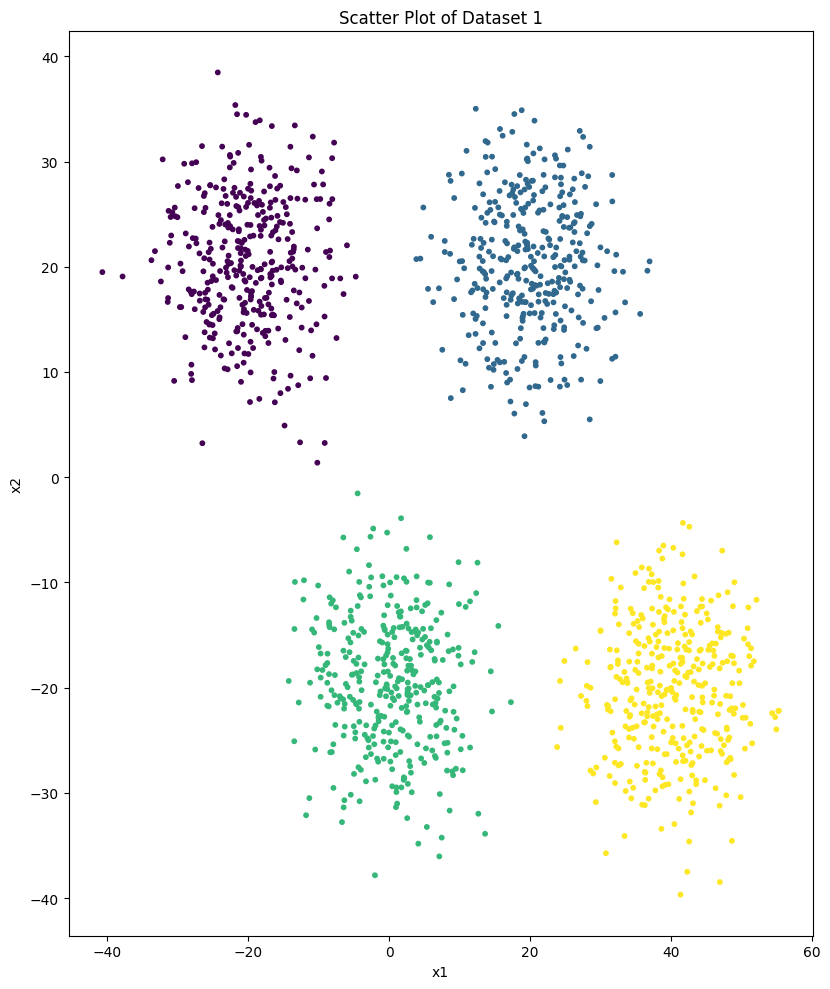

Class balance in Dataset 1:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64



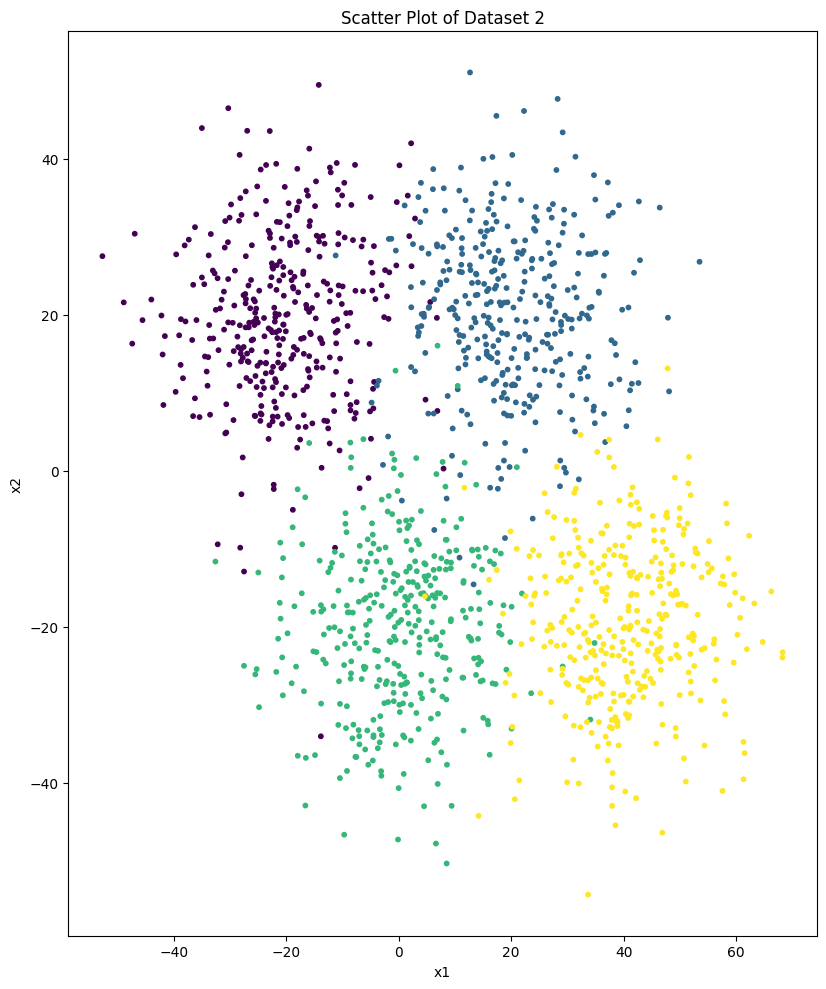

Class balance in Dataset 2:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64



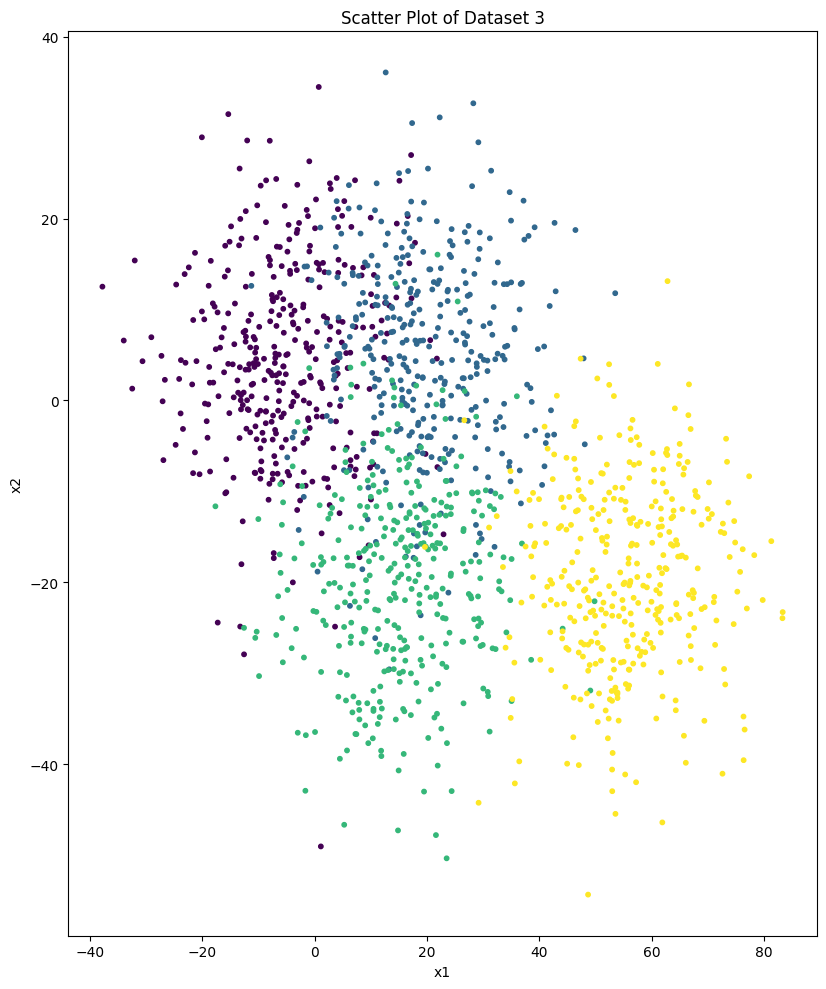

Class balance in Dataset 3:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64



In [3]:
# List of datasets
datasets = [(data_v0, "Dataset 1"), (data_v1, "Dataset 2"), (data_v2, "Dataset 3")]

# Iterate over each dataset for visualization and analysis
for i, (data, label) in enumerate(datasets):
    # Scatter Plot
    plt.figure(figsize=(16, 10))
    
    plt.subplot(1, 2, 1)
    plt.scatter(data['x1'], data['x2'], c=data['y'], cmap='viridis', s=10)
    plt.title(f'Scatter Plot of {label}')
    plt.xlabel('x1')
    plt.ylabel('x2')
    
    # # Histograms of x1 and x2
    # plt.subplot(1, 2, 2)
    # sns.histplot(data['x1'], kde=True, color='blue', label='x1', stat="density")
    # sns.histplot(data['x2'], kde=True, color='green', label='x2', stat="density")
    # plt.title(f'Feature Distribution in {label}')
    # plt.legend()
    
    plt.tight_layout()
    plt.savefig(f'Images/dataset-{i+1}-overview.png')
    plt.show()
    
    class_counts = data['y'].value_counts()
    print(f"Class balance in {label}:\n{class_counts}\n")

In [4]:
def draw_decision_boundary(model, X, y, resolution=100):
    # Set up the grid for plotting
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, resolution),
                         np.linspace(y_min, y_max, resolution))

    # Predict on the grid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.contourf(xx, yy, Z, cmap='viridis', alpha=0.7)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap='viridis', s=20)    

Classification results for Dataset 1:

Logistic Regression Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


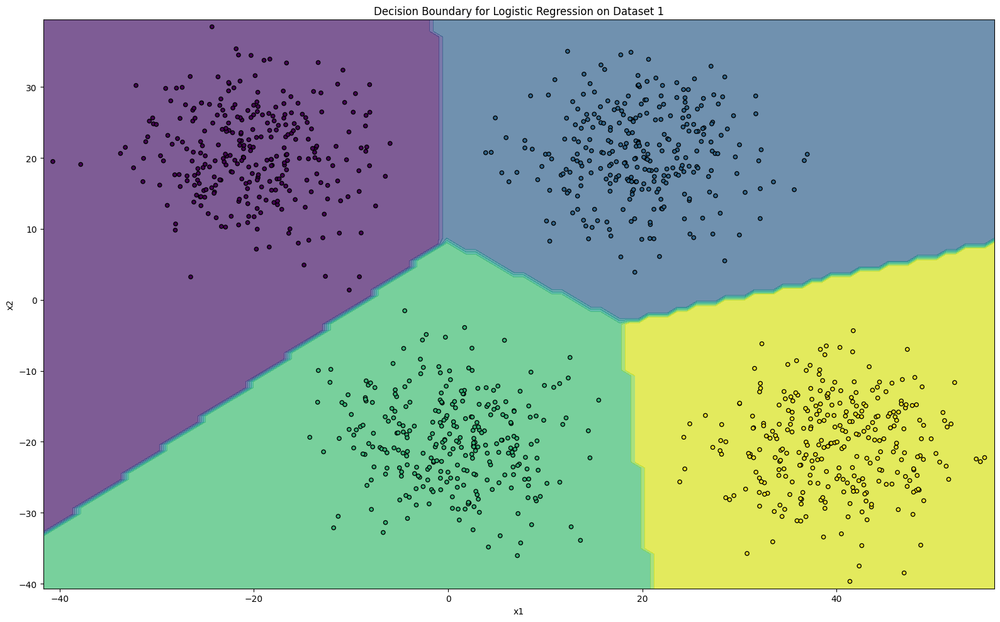

SVC Linear Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


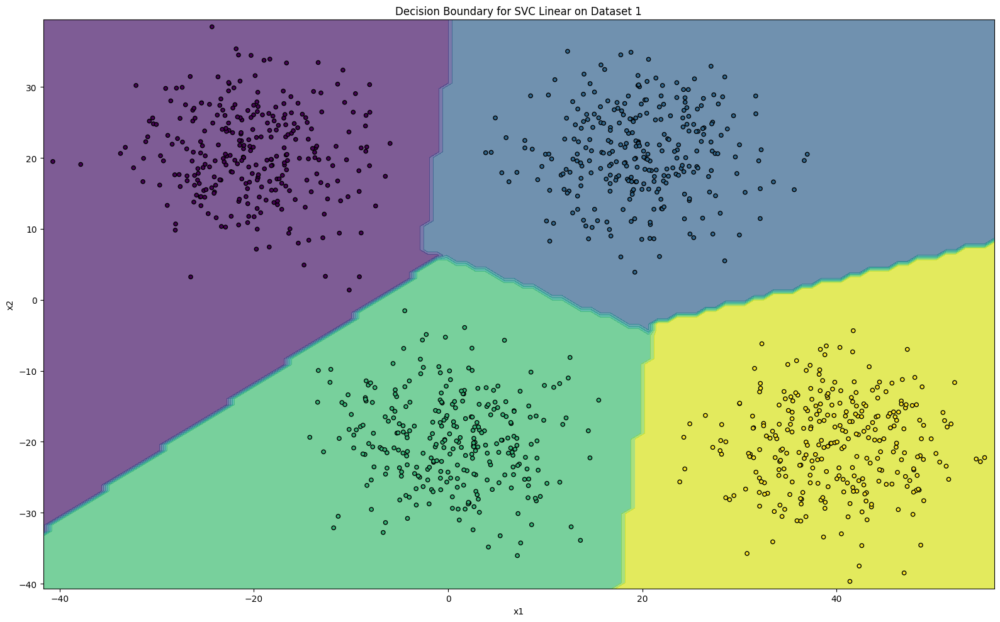

SVC RBF Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


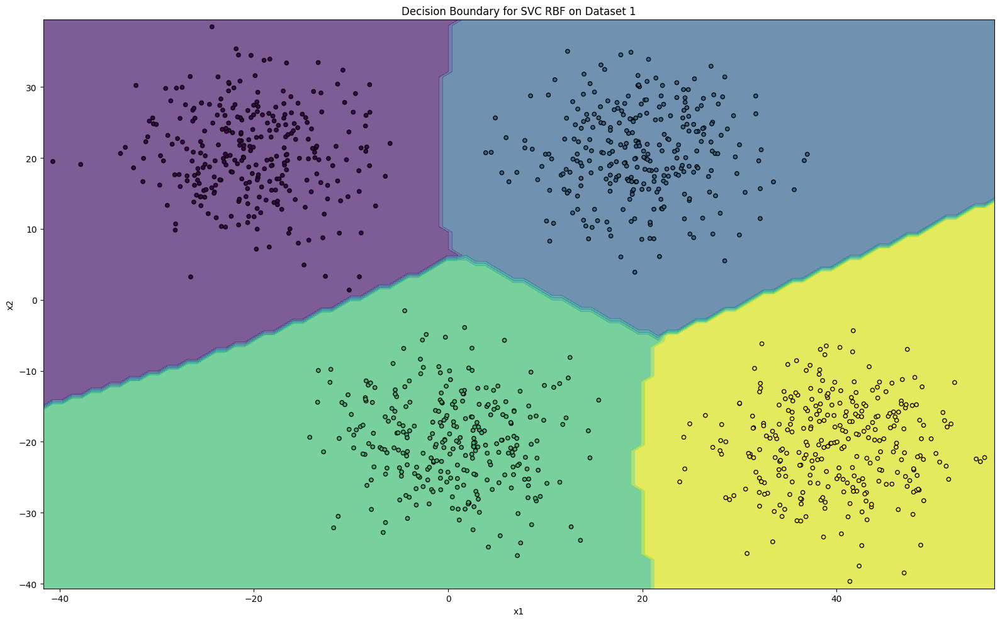

Random Forest (min_samples_leaf=1) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


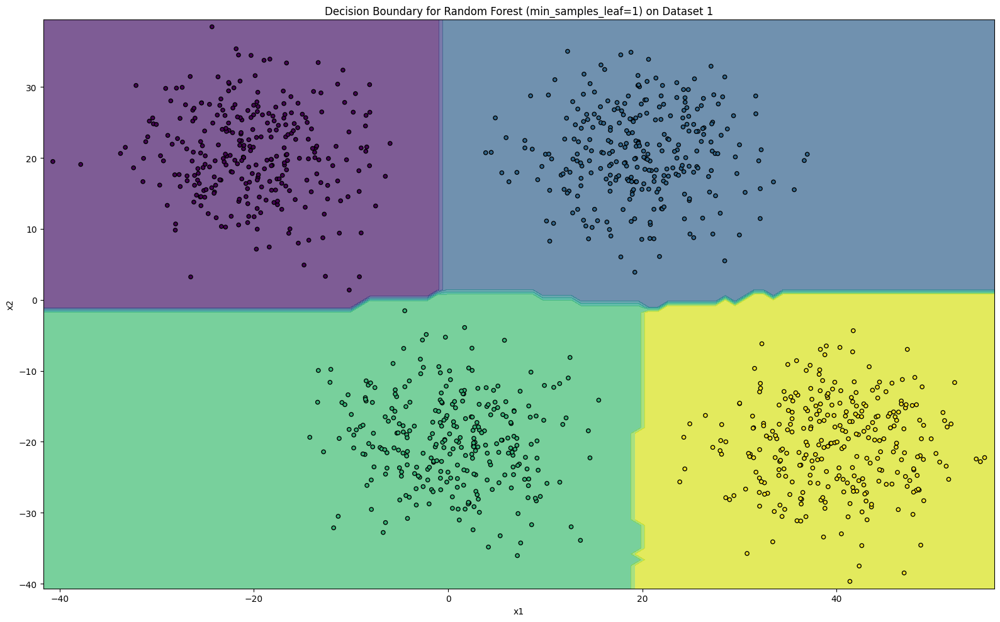

Random Forest (min_samples_leaf=3) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


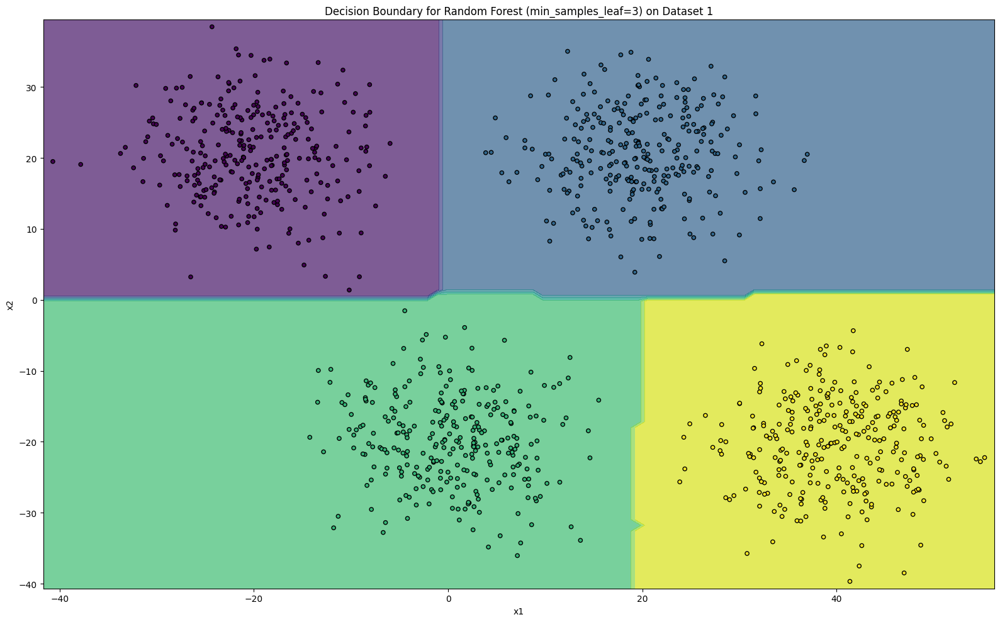

Random Forest (min_samples_leaf=5) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


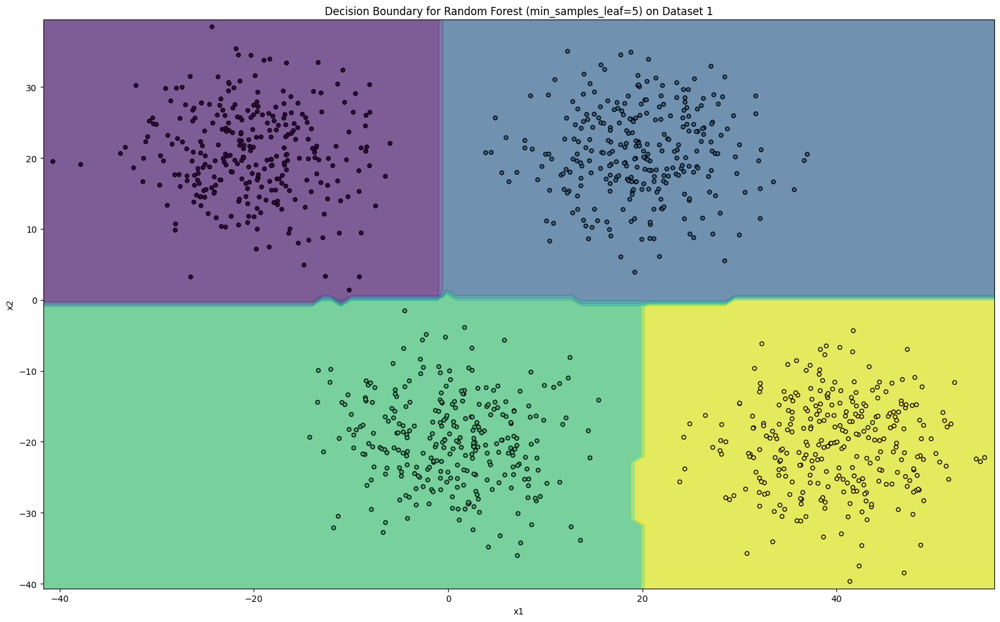

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      0.99      0.99        74
           4       0.99      1.00      0.99        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



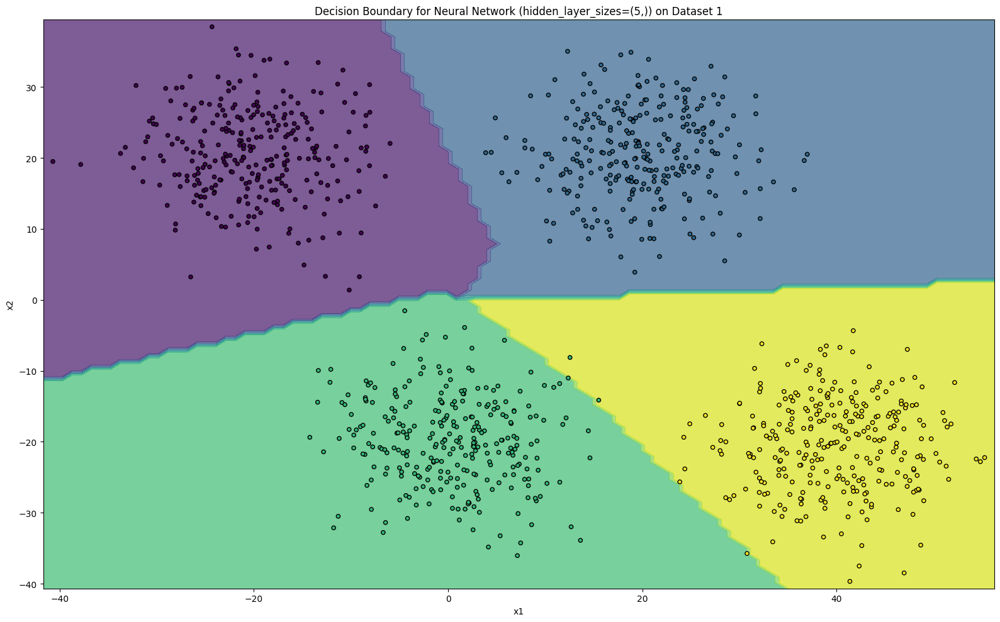

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 0.99, 0.99
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       0.99      1.00      0.99        75
           3       0.99      0.99      0.99        74
           4       0.99      0.97      0.98        71

    accuracy                           0.99       288
   macro avg       0.99      0.99      0.99       288
weighted avg       0.99      0.99      0.99       288



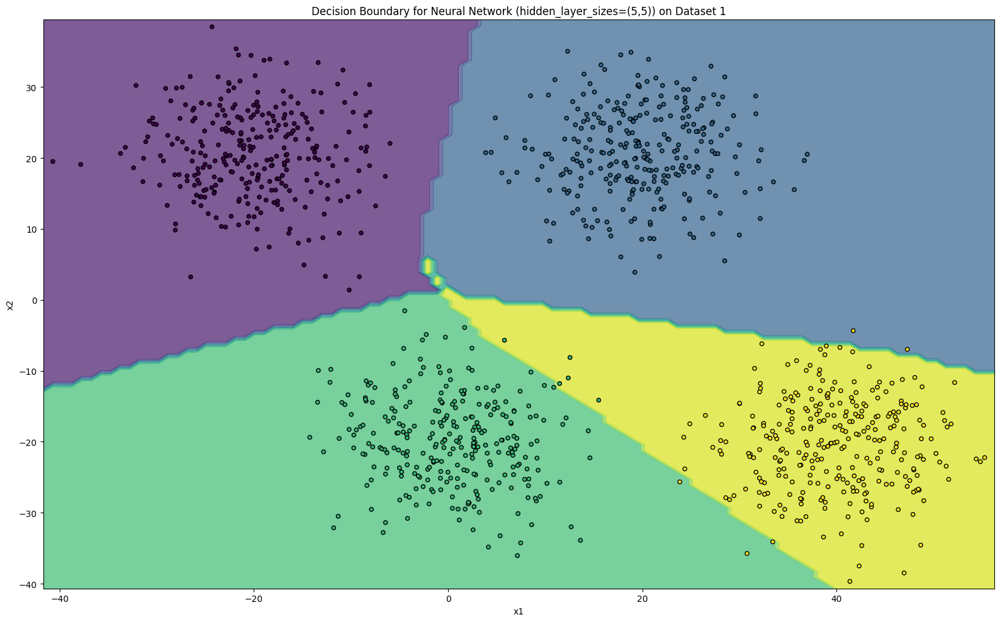

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 0.99, 0.99
              precision    recall  f1-score   support

           1       0.97      1.00      0.99        68
           2       0.99      1.00      0.99        75
           3       1.00      0.97      0.99        74
           4       0.99      0.97      0.98        71

    accuracy                           0.99       288
   macro avg       0.99      0.99      0.99       288
weighted avg       0.99      0.99      0.99       288



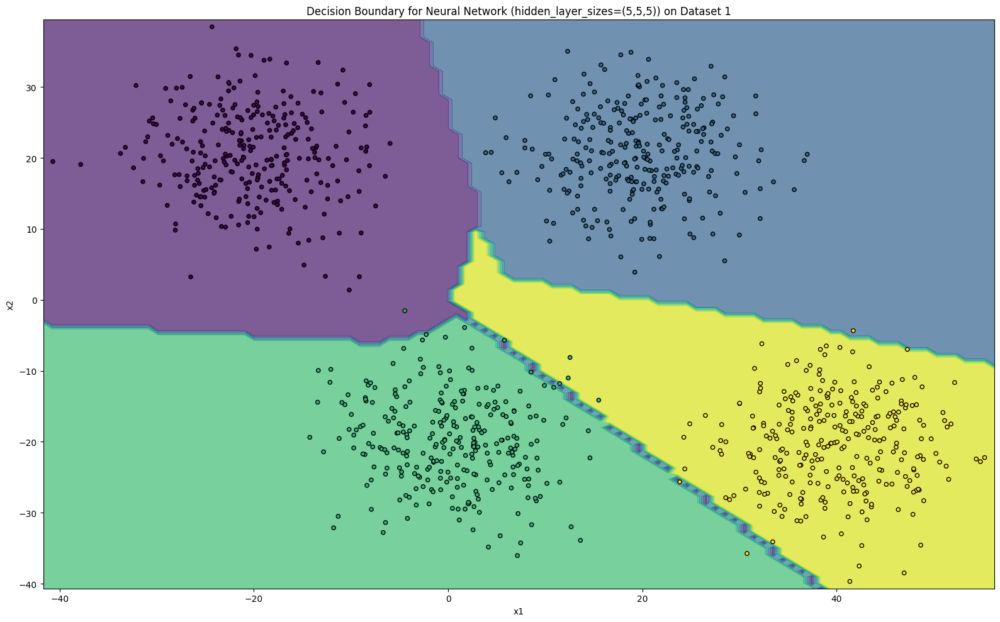

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      0.99      0.99        74
           4       0.99      1.00      0.99        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



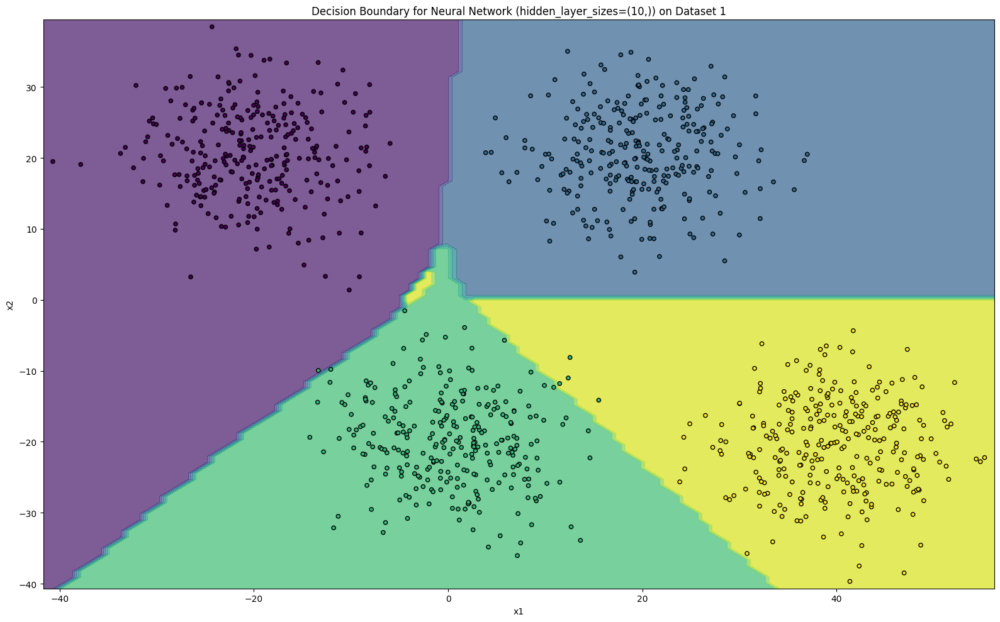



Classification results for Dataset 2:

Logistic Regression Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.97      0.93      0.95        75
           3       0.93      0.95      0.94        74
           4       0.94      0.96      0.95        71

    accuracy                           0.95       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


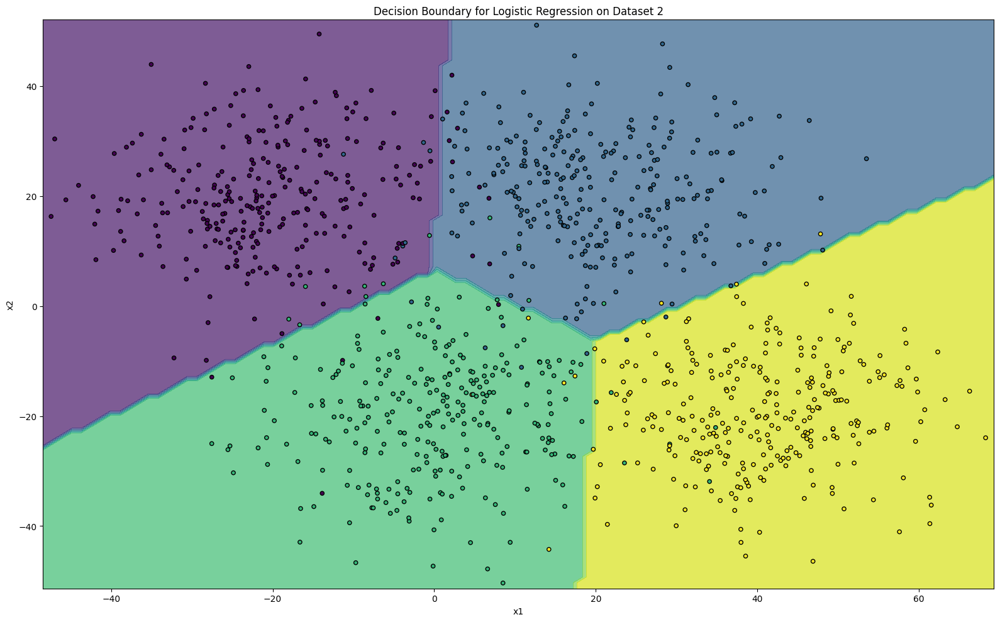

SVC Linear Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.97      0.93      0.95        75
           3       0.93      0.95      0.94        74
           4       0.94      0.96      0.95        71

    accuracy                           0.95       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


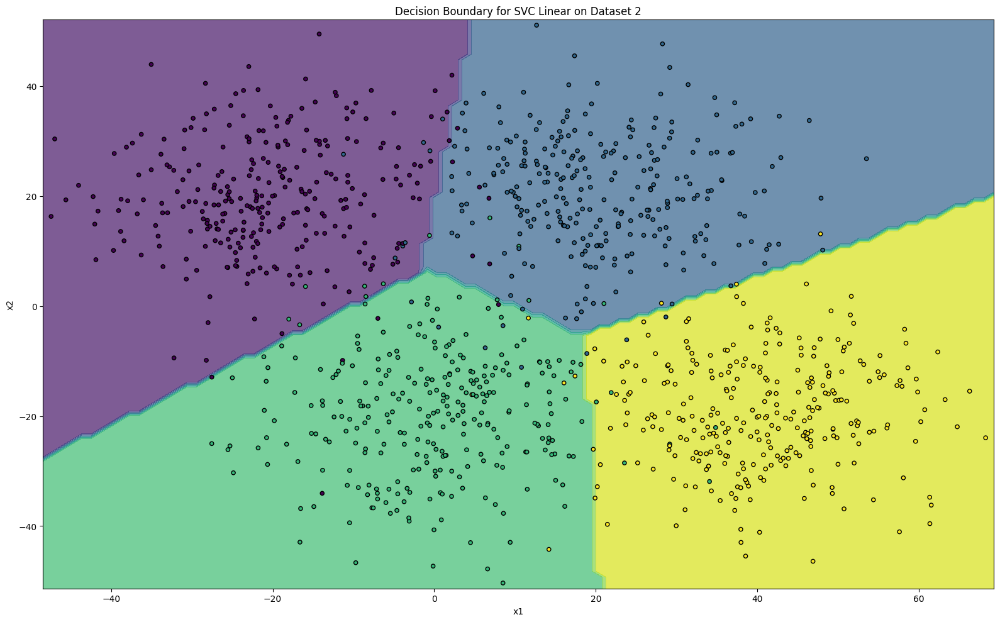

SVC RBF Accuracy: 0.96, 0.96
              precision    recall  f1-score   support

           1       0.96      0.99      0.97        68
           2       0.96      0.95      0.95        75
           3       0.94      0.97      0.95        74
           4       0.99      0.93      0.96        71

    accuracy                           0.96       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.96      0.96       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


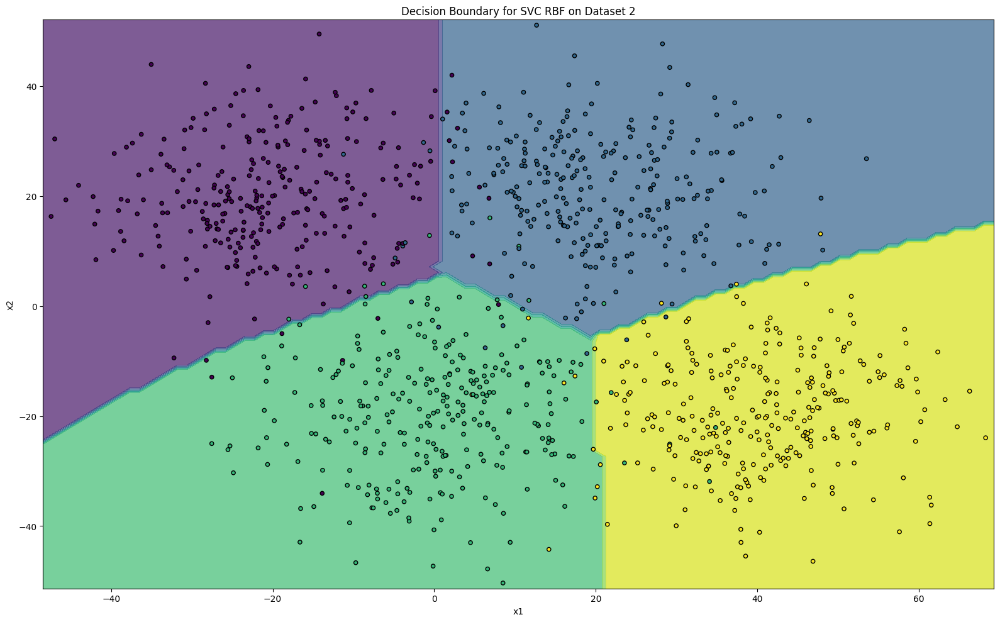

Random Forest (min_samples_leaf=1) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.91      0.99      0.94        68
           2       0.96      0.89      0.92        75
           3       0.96      0.93      0.95        74
           4       0.94      0.96      0.95        71

    accuracy                           0.94       288
   macro avg       0.94      0.94      0.94       288
weighted avg       0.94      0.94      0.94       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


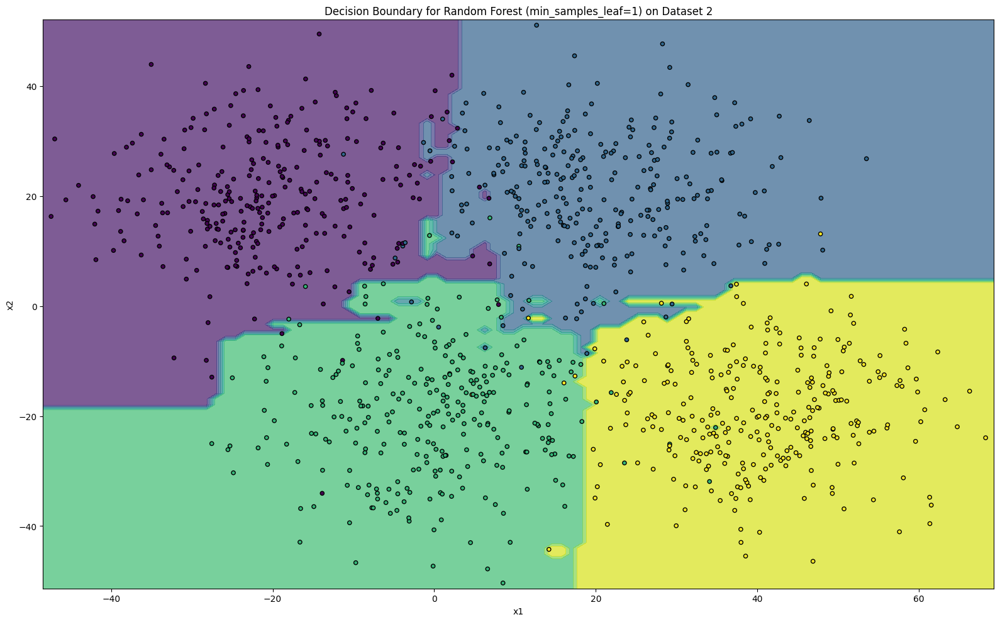

Random Forest (min_samples_leaf=3) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.93      0.99      0.96        68
           2       0.96      0.91      0.93        75
           3       0.95      0.95      0.95        74
           4       0.94      0.94      0.94        71

    accuracy                           0.94       288
   macro avg       0.94      0.95      0.94       288
weighted avg       0.94      0.94      0.94       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


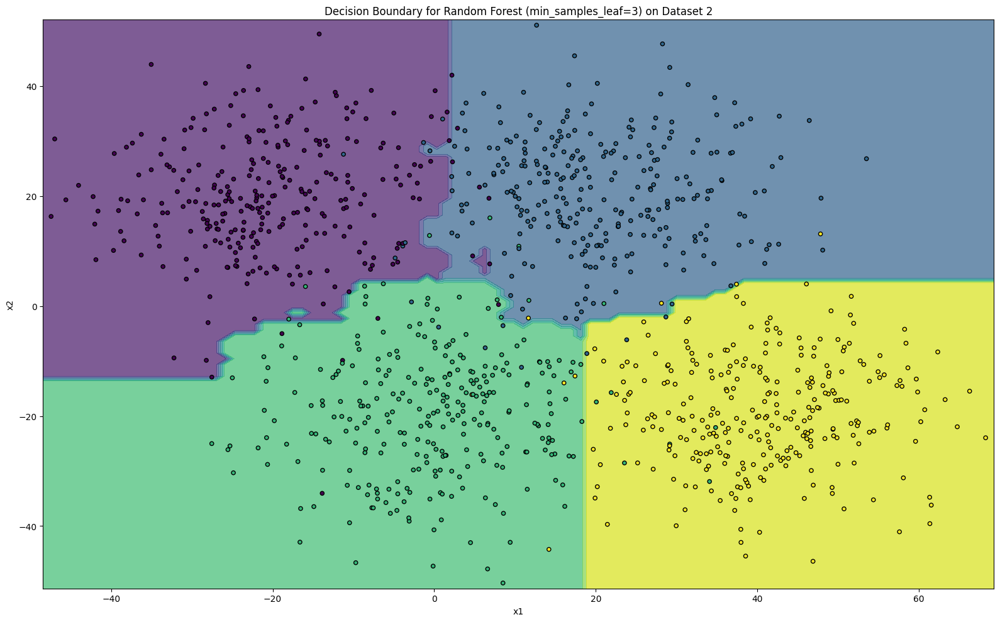

Random Forest (min_samples_leaf=5) Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.96      0.92      0.94        75
           3       0.95      0.96      0.95        74
           4       0.93      0.94      0.94        71

    accuracy                           0.95       288
   macro avg       0.95      0.95      0.95       288
weighted avg       0.95      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


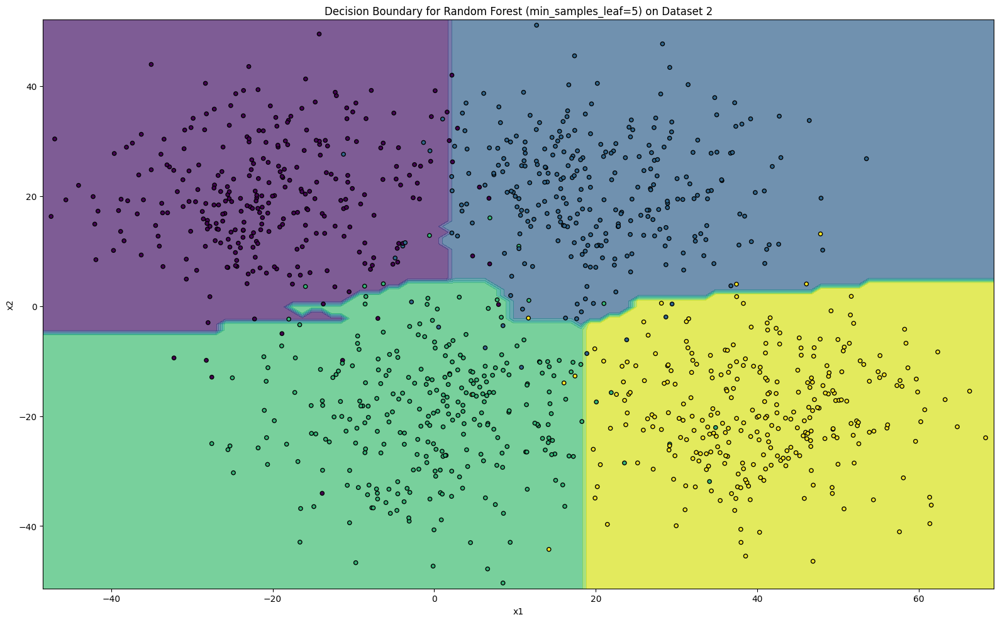

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 0.96, 0.96
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.99      0.92      0.95        75
           3       0.95      0.99      0.97        74
           4       0.94      0.96      0.95        71

    accuracy                           0.96       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.96      0.96       288



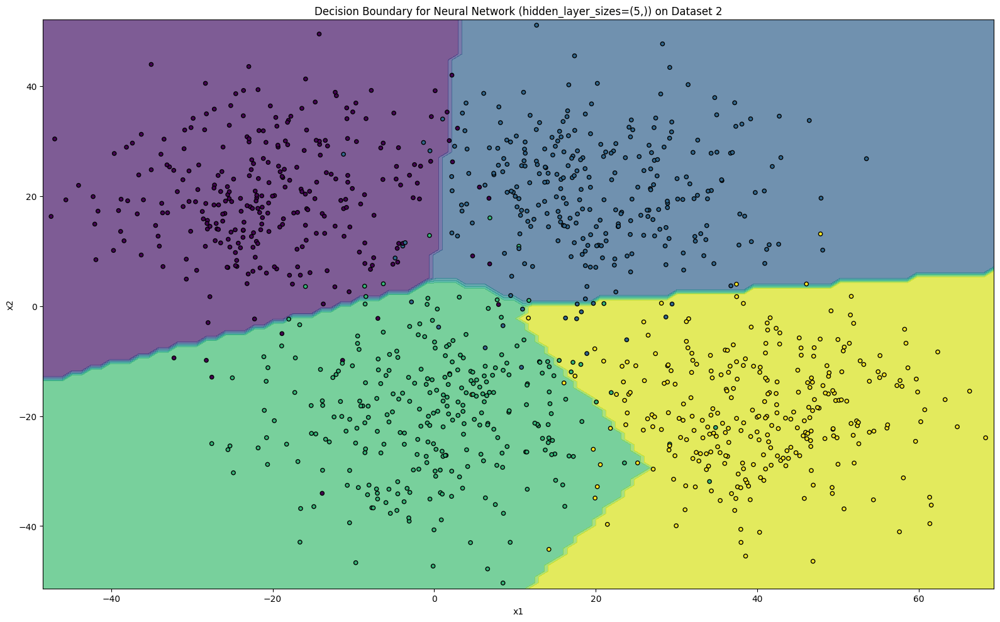

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 0.93, 0.93
              precision    recall  f1-score   support

           1       0.96      0.99      0.97        68
           2       0.99      0.92      0.95        75
           3       0.93      0.88      0.90        74
           4       0.85      0.93      0.89        71

    accuracy                           0.93       288
   macro avg       0.93      0.93      0.93       288
weighted avg       0.93      0.93      0.93       288



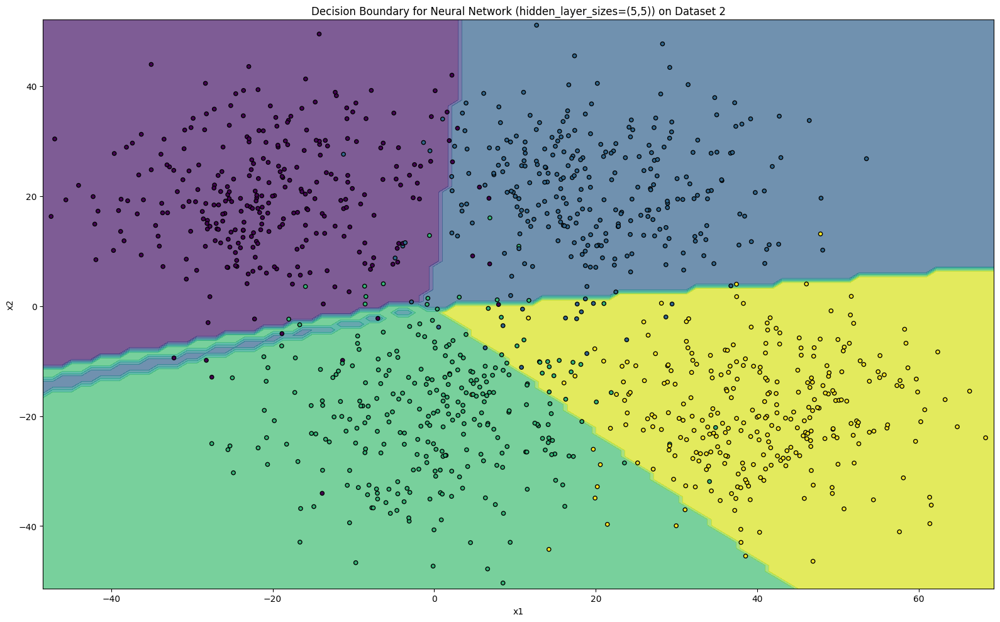

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 0.96, 0.96
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.96      0.93      0.95        75
           3       0.95      0.97      0.96        74
           4       0.96      0.94      0.95        71

    accuracy                           0.96       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.96      0.96       288



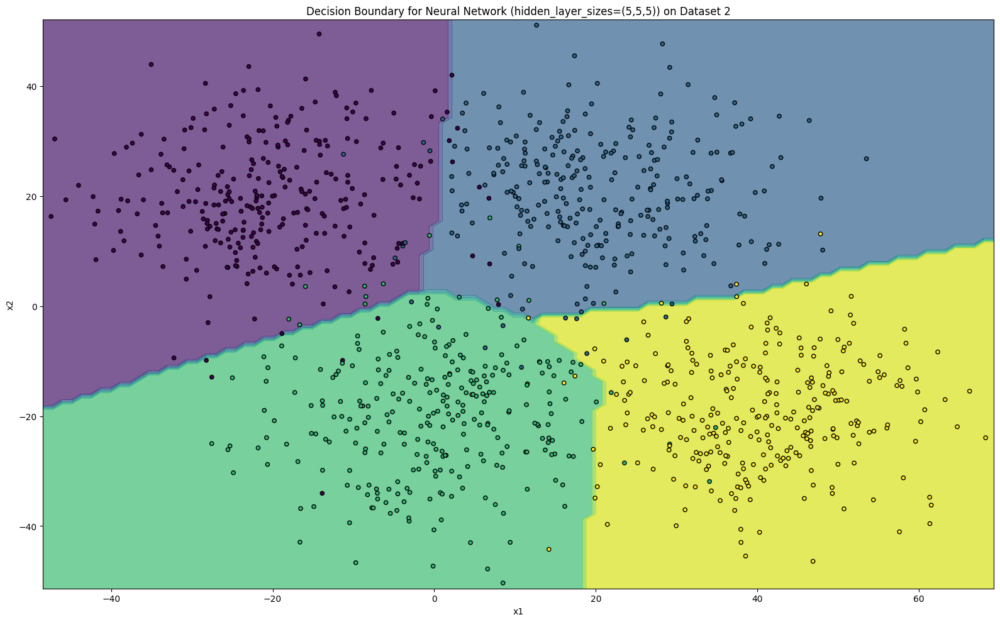

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.95      0.95      0.95        75
           3       0.93      0.91      0.92        74
           4       0.92      0.93      0.92        71

    accuracy                           0.94       288
   macro avg       0.94      0.94      0.94       288
weighted avg       0.94      0.94      0.94       288



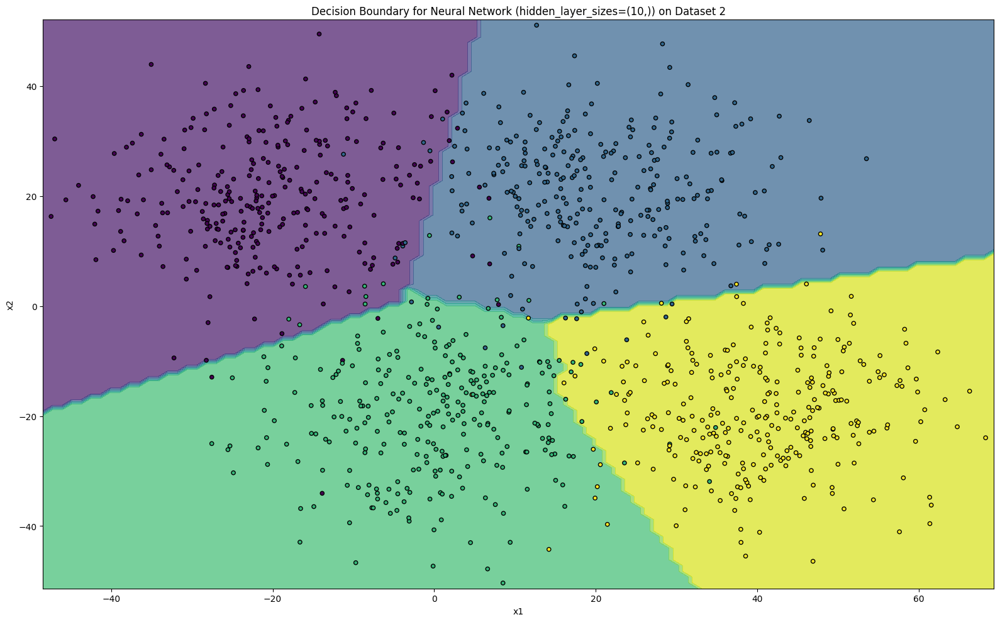



Classification results for Dataset 3:

Logistic Regression Accuracy: 0.86, 0.86
              precision    recall  f1-score   support

           1       0.81      0.91      0.86        68
           2       0.88      0.69      0.78        75
           3       0.81      0.89      0.85        74
           4       0.96      0.96      0.96        71

    accuracy                           0.86       288
   macro avg       0.86      0.86      0.86       288
weighted avg       0.87      0.86      0.86       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


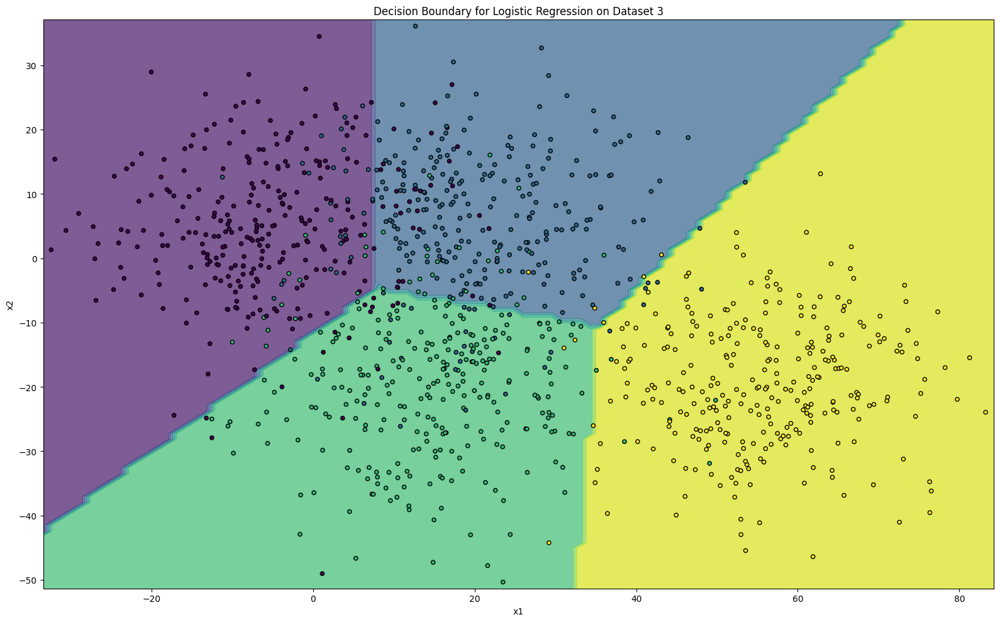

SVC Linear Accuracy: 0.86, 0.86
              precision    recall  f1-score   support

           1       0.81      0.90      0.85        68
           2       0.88      0.69      0.78        75
           3       0.82      0.92      0.87        74
           4       0.96      0.96      0.96        71

    accuracy                           0.86       288
   macro avg       0.87      0.87      0.86       288
weighted avg       0.87      0.86      0.86       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


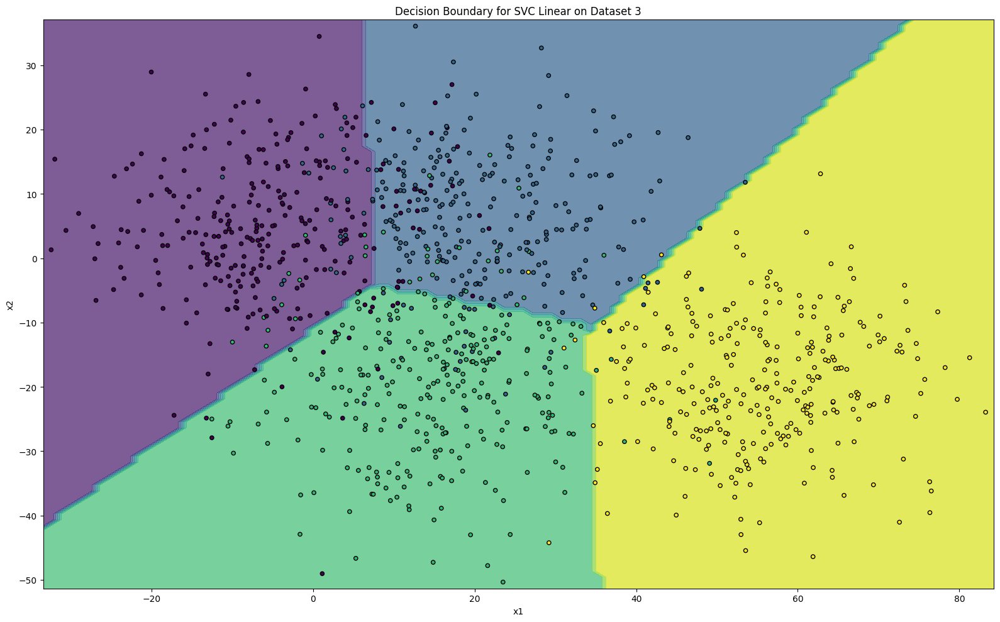

SVC RBF Accuracy: 0.87, 0.87
              precision    recall  f1-score   support

           1       0.83      0.87      0.85        68
           2       0.89      0.72      0.79        75
           3       0.80      0.95      0.87        74
           4       0.99      0.96      0.97        71

    accuracy                           0.87       288
   macro avg       0.88      0.87      0.87       288
weighted avg       0.88      0.87      0.87       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


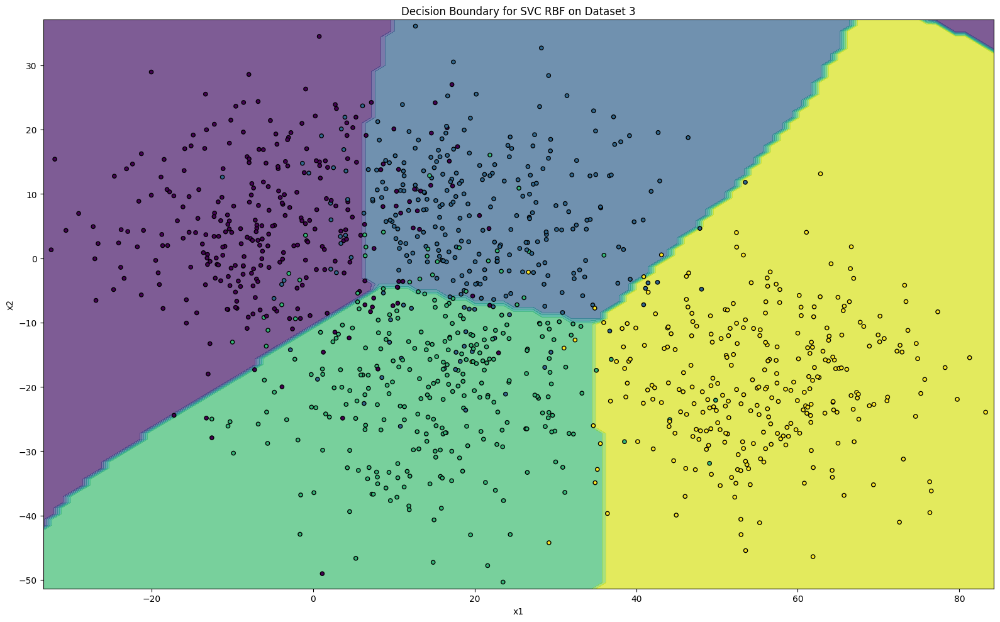

Random Forest (min_samples_leaf=1) Accuracy: 0.84, 0.84
              precision    recall  f1-score   support

           1       0.80      0.88      0.84        68
           2       0.84      0.64      0.73        75
           3       0.81      0.88      0.84        74
           4       0.91      0.97      0.94        71

    accuracy                           0.84       288
   macro avg       0.84      0.84      0.84       288
weighted avg       0.84      0.84      0.84       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


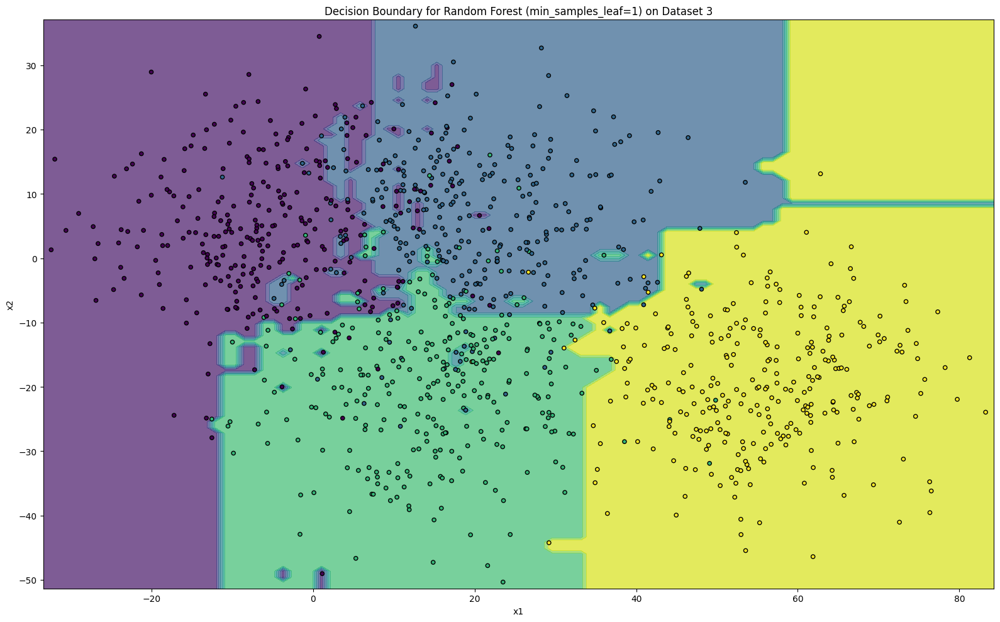

Random Forest (min_samples_leaf=3) Accuracy: 0.85, 0.85
              precision    recall  f1-score   support

           1       0.80      0.90      0.85        68
           2       0.88      0.68      0.77        75
           3       0.81      0.88      0.84        74
           4       0.93      0.97      0.95        71

    accuracy                           0.85       288
   macro avg       0.86      0.86      0.85       288
weighted avg       0.86      0.85      0.85       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


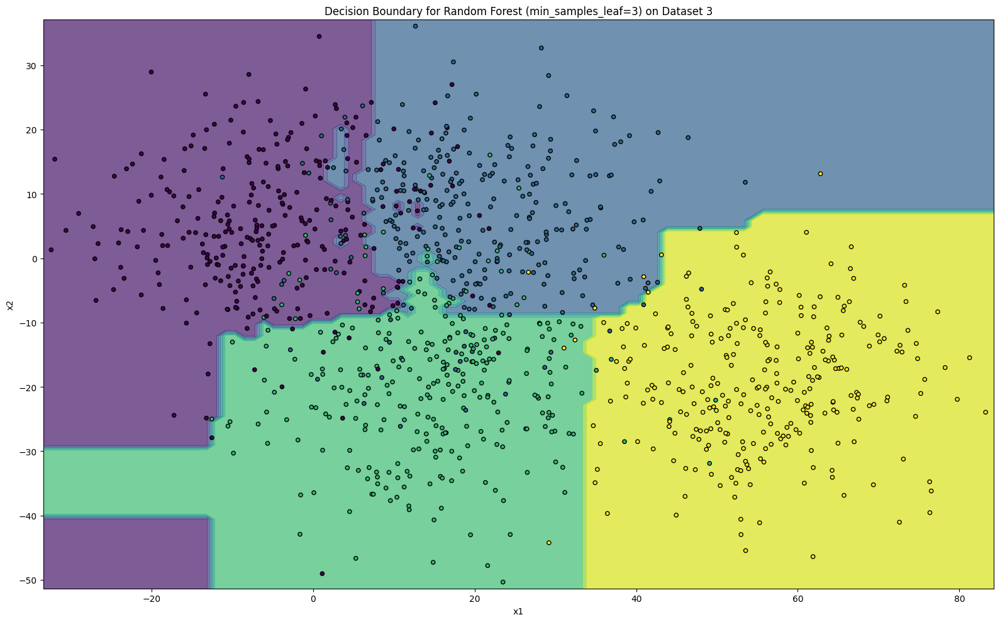

Random Forest (min_samples_leaf=5) Accuracy: 0.85, 0.85
              precision    recall  f1-score   support

           1       0.80      0.90      0.85        68
           2       0.88      0.68      0.77        75
           3       0.81      0.89      0.85        74
           4       0.93      0.96      0.94        71

    accuracy                           0.85       288
   macro avg       0.86      0.86      0.85       288
weighted avg       0.86      0.85      0.85       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


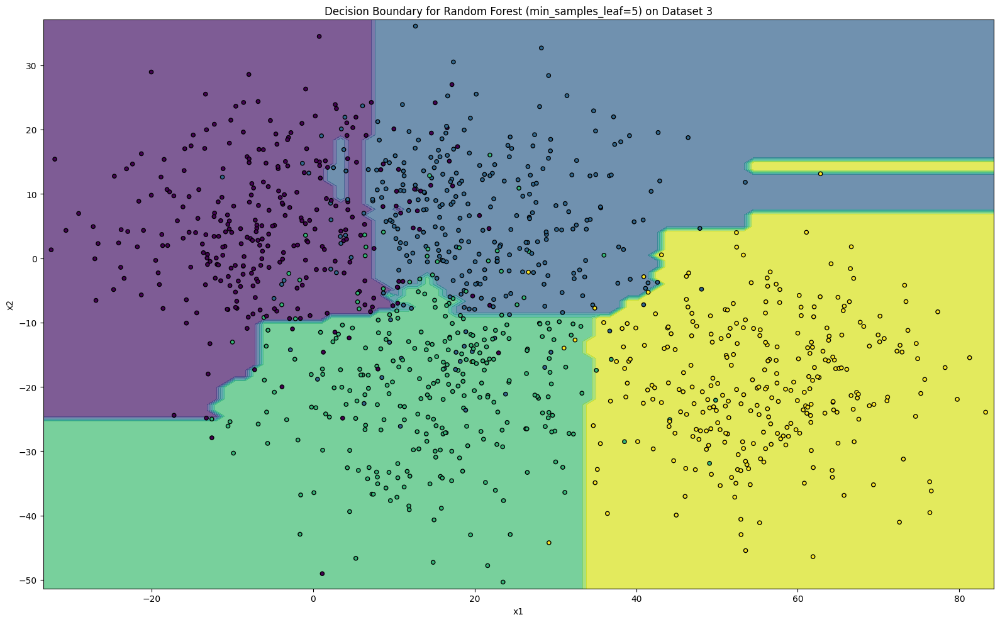

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 0.76, 0.76
              precision    recall  f1-score   support

           1       0.78      0.88      0.83        68
           2       0.88      0.57      0.69        75
           3       0.80      0.69      0.74        74
           4       0.66      0.92      0.77        71

    accuracy                           0.76       288
   macro avg       0.78      0.77      0.76       288
weighted avg       0.78      0.76      0.76       288



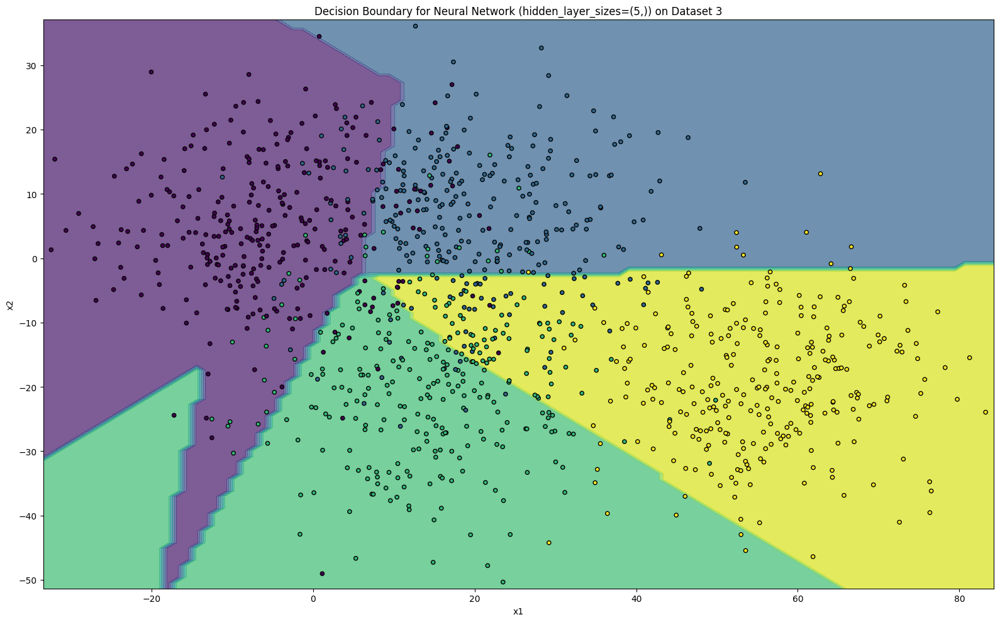

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 0.83, 0.83
              precision    recall  f1-score   support

           1       0.83      0.84      0.83        68
           2       0.86      0.67      0.75        75
           3       0.79      0.89      0.84        74
           4       0.87      0.94      0.91        71

    accuracy                           0.83       288
   macro avg       0.84      0.84      0.83       288
weighted avg       0.84      0.83      0.83       288



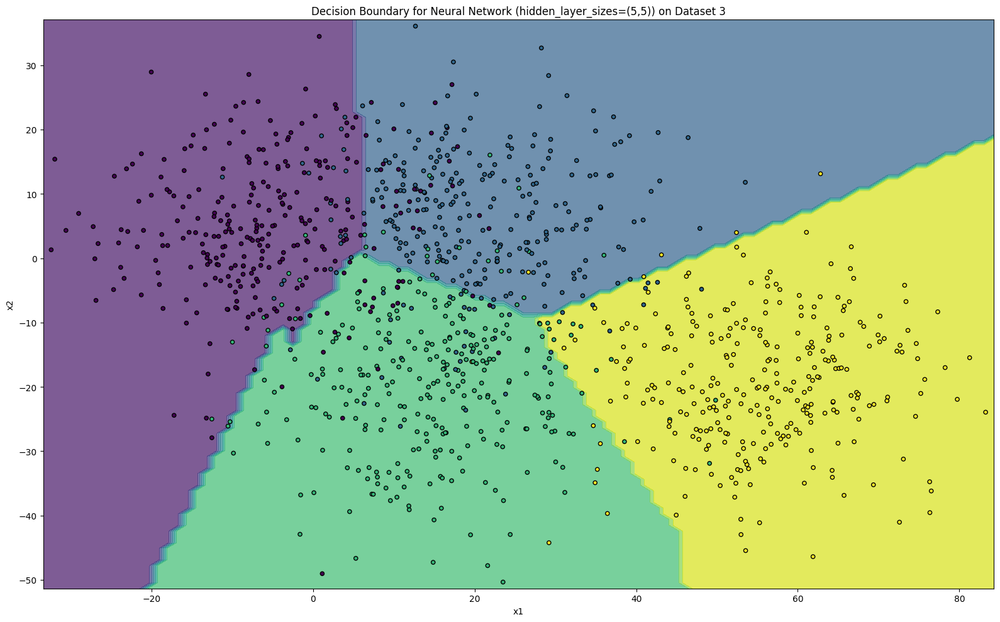

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 0.83, 0.83
              precision    recall  f1-score   support

           1       0.81      0.87      0.84        68
           2       0.87      0.61      0.72        75
           3       0.80      0.91      0.85        74
           4       0.85      0.93      0.89        71

    accuracy                           0.83       288
   macro avg       0.83      0.83      0.82       288
weighted avg       0.83      0.83      0.82       288



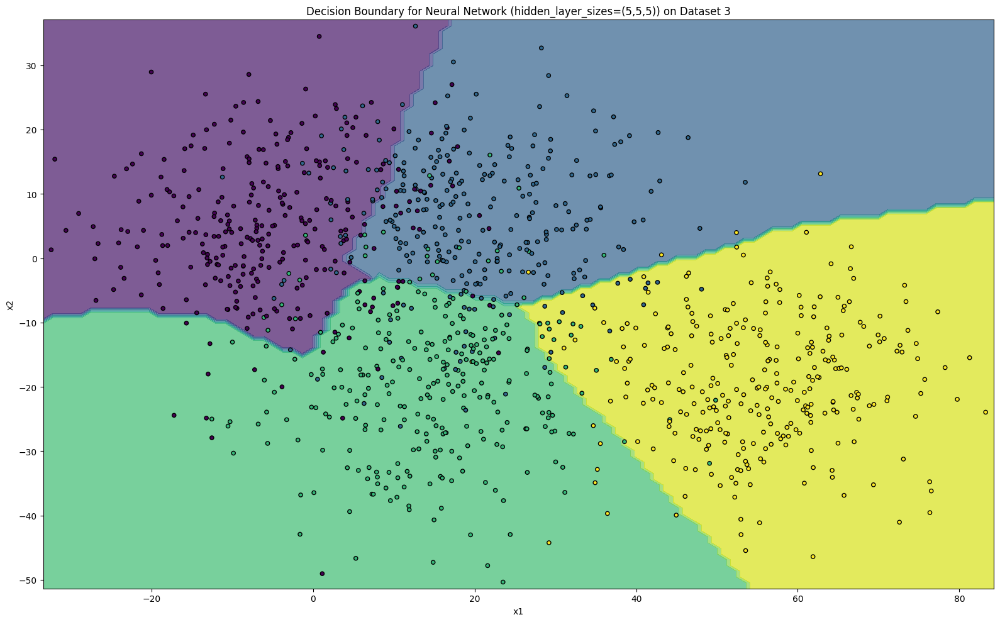

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 0.81, 0.81
              precision    recall  f1-score   support

           1       0.84      0.79      0.82        68
           2       0.84      0.69      0.76        75
           3       0.77      0.82      0.80        74
           4       0.80      0.93      0.86        71

    accuracy                           0.81       288
   macro avg       0.81      0.81      0.81       288
weighted avg       0.81      0.81      0.81       288



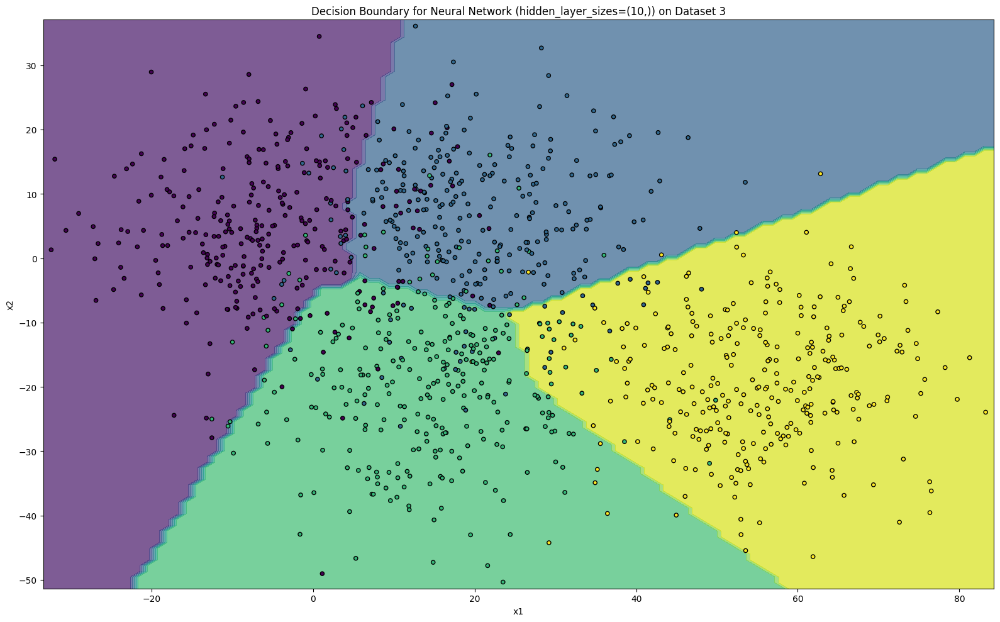

In [5]:
# Initialize classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVC Linear': SVC(kernel='linear', probability=True),
    'SVC RBF': SVC(kernel='rbf', probability=True),
    'Random Forest (min_samples_leaf=1)': RandomForestClassifier(min_samples_leaf=1),
    'Random Forest (min_samples_leaf=3)': RandomForestClassifier(min_samples_leaf=3),
    'Random Forest (min_samples_leaf=5)': RandomForestClassifier(min_samples_leaf=5),
    'Neural Network (hidden_layer_sizes=(5,))': MLPClassifier(hidden_layer_sizes=(5,)),
    'Neural Network (hidden_layer_sizes=(5,5))': MLPClassifier(hidden_layer_sizes=(5,5)),
    'Neural Network (hidden_layer_sizes=(5,5,5))': MLPClassifier(hidden_layer_sizes=(5,5,5)),
    'Neural Network (hidden_layer_sizes=(10,))': MLPClassifier(hidden_layer_sizes=(10,))
}

# Iterate over each dataset for classification
for i, (data, label) in enumerate(datasets):
    print(f"Classification results for {label}:\n")
    x_train, x_test, y_train, y_test = train_test_split(data[['x1','x2']], data['y'], test_size=0.2, random_state=42)
    
    for name, clf in classifiers.items():
        clf.fit(x_train, y_train)
        y_pred = clf.predict(x_test)
        acc = accuracy_score(y_test, y_pred) # model.score(x_test, y_test)
        print(f"{name} Accuracy: {acc:.2f}, {clf.score(x_test, y_test):.2f}")
        print(classification_report(y_test, y_pred))

        # Plot decision boundary
        plt.figure(figsize=(16, 10))
        draw_decision_boundary(clf, x_train.values, y_train.values)
        plt.title(f'Decision Boundary for {name} on {label}')
        plt.xlabel('x1')
        plt.ylabel('x2')
        plt.tight_layout()
        plt.savefig(f'Images/dataset-{i+1}-{name}-decision-boundary.png')
        plt.show()
    print("\n")

In [6]:
# make a csv file, headers algorithm_name, train_or_test_data, accuracy, precision_1, precision_2, precision_3, precision_4, precision_avg, recall_1, recall_2, recall_3, recall_4, recall_avg, f1_1, f1_2, f1_3, f1_4, f1_avg, auc_1, auc_2, auc_3, auc_4, auc_avg
# for each algorithm, for train and test data

def get_metrics(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict=True)
    acc = accuracy_score(y_true, y_pred)
    precisions = [report[f'{i+1}']['precision'] for i in range(4)]
    recalls = [report[f'{i+1}']['recall'] for i in range(4)]
    f1s = [report[f'{i+1}']['f1-score'] for i in range(4)]
    aucs = roc_auc_score(y_true, pd.get_dummies(y_pred), multi_class='ovr', average=None)
    
    precision_avg = sum(precisions) / 4
    recall_avg = sum(recalls) / 4
    f1_avg = sum(f1s) / 4
    auc_avg = sum(aucs) / 4
    
    return [acc, *precisions, precision_avg, *recalls, recall_avg, *f1s, f1_avg, *aucs, auc_avg]

def get_metrics_df(data, label, classifiers):
    x_train, x_test, y_train, y_test = train_test_split(data[['x1', 'x2']], data['y'], test_size=0.2, random_state=42)
    metrics = []
    
    for name, clf in classifiers.items():
        clf.fit(x_train, y_train)
        
        # Train predictions and metrics
        y_train_pred = clf.predict(x_train)
        train_metrics = get_metrics(y_train, y_train_pred)
        
        # Test predictions and metrics
        y_test_pred = clf.predict(x_test)
        test_metrics = get_metrics(y_test, y_test_pred)
        
        # Append results for train and test sets
        metrics.append([name, 'train', *train_metrics])
        metrics.append([name, 'test', *test_metrics])
    
    # Define the DataFrame columns
    columns = ['algorithm_name', 'train_or_test_data', 'accuracy',
               'precision_1', 'precision_2', 'precision_3', 'precision_4', 'precision_avg',
               'recall_1', 'recall_2', 'recall_3', 'recall_4', 'recall_avg',
               'f1_1', 'f1_2', 'f1_3', 'f1_4', 'f1_avg',
               'auc_1', 'auc_2', 'auc_3', 'auc_4', 'auc_avg']
    
    ret = pd.DataFrame(metrics, columns=columns)
    
    return ret

for i, (data, label) in enumerate(datasets):
    metrics_df = get_metrics_df(data, label, classifiers)
    metrics_df.to_csv(f'Metrics/metrics-{i+1}.csv', index=False)


/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-pac

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: User

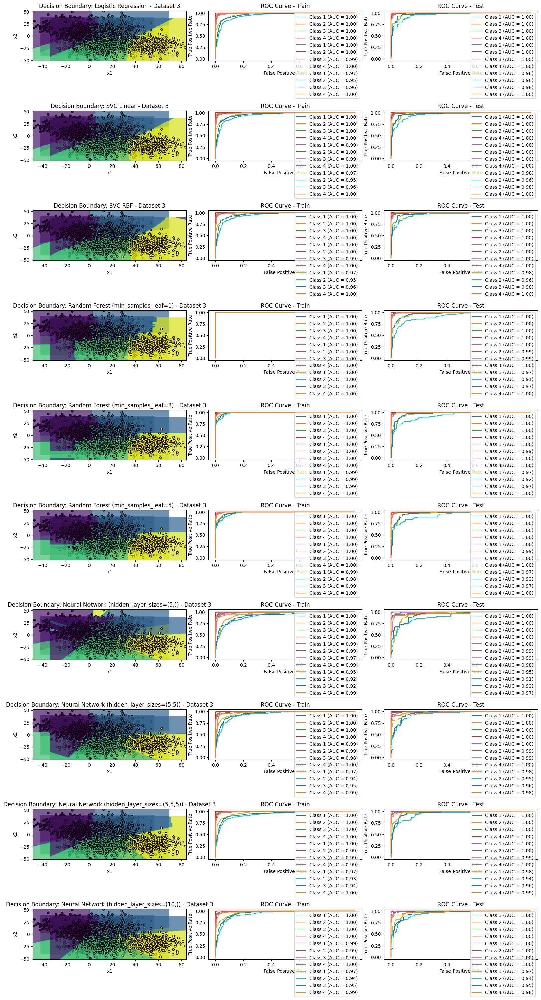

In [8]:
def draw_roc_curve(model, X, y, label):
    if hasattr(model, 'predict_proba'):
        y_prob = model.predict_proba(X)
    else:
        # For classifiers that don't have predict_proba, use decision_function and normalize
        y_prob = model.decision_function(X)
        y_prob = (y_prob - y_prob.min()) / (y_prob.max() - y_prob.min())  # Normalize to [0, 1]
    
    for i in range(4):  # Assuming 4 classes
        fpr, tpr, _ = roc_curve(y == i+1, y_prob[:, i] if len(y_prob.shape) > 1 else y_prob)
        auc_score = roc_auc_score(y == i+1, y_prob[:, i] if len(y_prob.shape) > 1 else y_prob)
        plt.plot(fpr, tpr, label=f'Class {i+1} (AUC = {auc_score:.2f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {label}')
    plt.legend()

def draw_plots(classifiers, datasets):
    plt.figure(figsize=(16, 30))  # Adjust the figure size to accommodate 10 rows and 3 columns
    num_classifiers = len(classifiers)
    
    for row, (name, clf) in enumerate(classifiers.items()):
        for i, (data, label) in enumerate(datasets):
            x_train, x_test, y_train, y_test = train_test_split(data[['x1', 'x2']], data['y'], test_size=0.2, random_state=42)
            
            clf.fit(x_train, y_train)
            
            # First column: Decision boundary
            plt.subplot(num_classifiers, 3, row * 3 + 1)
            draw_decision_boundary(clf, x_train.values, y_train.values)  # Assuming you have a function for this
            plt.title(f'Decision Boundary: {name} - {label}')
            plt.xlabel('x1')
            plt.ylabel('x2')

            # Second column: ROC curve for train data
            plt.subplot(num_classifiers, 3, row * 3 + 2)
            draw_roc_curve(clf, x_train, y_train, 'Train')

            # Third column: ROC curve for test data
            plt.subplot(num_classifiers, 3, row * 3 + 3)
            draw_roc_curve(clf, x_test, y_test, 'Test')

    plt.tight_layout()
    plt.savefig('Images/all-plots.png')
    plt.show()

# Call the function to draw the plots
draw_plots(classifiers, datasets)